<a href="https://colab.research.google.com/github/jimmygohhanjie/keras_FNN_student_aid/blob/main/106v2_23A464A_JIMMY_GOH.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



---
# ITI106 Deep Learning foundation Project
## Student Score Prediction
---
* 23A464A JIMMY GOH HAN JIE




# 1 - Problem statement


---
Project challenge source : [AIAP past year project assessment](https://github.com/aisingapore/AIAP-Technical-Assessment-Past-Years-Series/tree/main/StudentScorePrediction)


The client U.A secondary School want me to build a model that can predict the students' O-level mathematics examination scores to identify weaker students prior to the examinaiton timely.

Additional support can then be rendered to the students to ensure they are more preopared for the upcoming exam. I will be given access to U.A Secondary School's past students' performance [dataset ](https://techassessment.bob.core.windows.net/aiap-preparatory-bootcamp/score.db)

# 2. ML Proposed solutions

Additional Support will be render to student at borderline or fail, B5 and below, [Singapore O's level grading](https://en.wikipedia.org/wiki/Academic_grading_in_Singapore). Student with the score of 64 and below will be classified as add_support = 1, score of 65 and above = 0.
Using past students' characterisc dataset to train Machine Learning models to predict if current batch of student require add_support

1.   Hueristic : Classical supervised classified Machine learning will be used to predict if add_support is required

2.   Model: Feed Forward Fully Connected Neural Network model will be used to predict if add_support is required



##Features columns Description

|Attribute | Description |
-------------------|------------------
|student_id | Unique ID for each student|
| number_of_siblings|Number of siblings|
direct_admission | Mode of entering the school
CCA |Enrolled CCA
learning_style| Primary learning style
tuition|Indication of whether the student has a tuition
final_test|Student’s O-level mathematics examination score
n_male|Number of male classmates
n_female|Number of female classmates
gender|Gender type
age|Age of the student
hours_per_week|Number of hours student studies per week
attendance_rate|Attendance rate of the student (%)
sleep_time|Daily sleeping time (hour:minutes)
wake_time|Daily waking up time (hour:minutes)
mode_of_transport|Mode of transport to school
bag_color|Colour of student’s bag


##Evaluation metric
Accuracy, Precision, Recall and F1 will be evaluated. Models will be tuned to enhance Recall, as it is costlier to have False Negative (Students that need additional support are predicted as no additional support required)

Accuracy represents the number of correctly classified prediction over the total number of validation records.

Precision should ideally be 1 (high) for a good classifier. Precision becomes 1 only when the numerator and denominator are equal i.e True Postive = True Postive + False Postive, this also means False Postive is zero.

Recall should ideally be 1 (high) for a good classifier. Recall becomes 1 only when the numerator and denominator are equal i.e True Postive = True Postive + False Negative.

F1 Score should ideally be 1 (high) for a good classifier. F1 Score becomes 1 only when precision and recall are both 1. F1 score is the harmonic mean of precision and recall and is a better measure than accuracy.


# 2 - Data Preparation

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Data source**

Downloaded the db seperately and saved in google drive for this project usage

https://techassessment.bob.core.windows.net/aiap-preparatory-bootcamp/score.db


pre-connection checks to obtain db list of tables name
```
import csv
import sqlite3

connect = sqlite3.connect('score.db')
cursor_obj = connect.cursor()

conn = sqlite3.connect('score.db')
cursor = conn.cursor()
cursor.execute("select * from score;")
with open("score.csv", 'w',newline='') as csv_file:
    csv_writer = csv.writer(csv_file)
    csv_writer.writerow([i[0] for i in cursor.description])
    csv_writer.writerows(cursor)
conn.close()

```

checks for table name available in db

```
r_set=cursor_obj.execute('''select name from sqlite_master
		where type = 'table' ''')
for row in r_set:
    print(row)
```
('score',)




In [ ]:
import sqlite3
import pandas as pd

#connect to DB
con = sqlite3.connect('/content/drive/My Drive/Colab_Notebooks/NYP_AIML/106_deep_learning_foundation/data/score.db')

#extract db into dataframe score_df
score_df = pd.read_sql_query("select * from score;", con, index_col=None)


In [ ]:
score_df.head(5)


,index,number_of_siblings,direct_admission,CCA,learning_style,student_id,gender,tuition,final_test,n_male,n_female,age,hours_per_week,attendance_rate,sleep_time,wake_time,mode_of_transport,bag_color
0,0,0,Yes,Sports,Visual,ACN2BE,Female,No,69.0,14.0,2.0,16.0,10.0,91.0,22:00,6:00,private transport,yellow
1,1,2,No,Sports,Auditory,FGXIIZ,Female,No,47.0,4.0,19.0,16.0,7.0,94.0,22:30,6:30,private transport,green
2,2,0,Yes,None,Visual,B9AI9F,Male,No,85.0,14.0,2.0,15.0,8.0,92.0,22:30,6:30,private transport,white
3,3,1,No,Clubs,Auditory,FEVM1T,Female,Yes,64.0,2.0,20.0,15.0,18.0,NaN,21:00,5:00,public transport,yellow
4,4,0,No,Sports,Auditory,AXZN2E,Male,No,66.0,24.0,3.0,16.0,7.0,95.0,21:30,5:30,public transport,yellow


In [ ]:
#check for categorical inconsistency input

print("direct_admission : ", score_df['direct_admission'].unique())
print("CCA : ",score_df['CCA'].unique())
print("learning_style : ",score_df['learning_style'].unique())
#print("student_id : ",score_df['student_id'].unique())
print("gender : ",score_df['gender'].unique())
print("tuition : ",score_df['tuition'].unique())
print("gender : ",score_df['gender'].unique())
print("sleep_time : ",score_df['sleep_time'].unique())
print("wake_time : ",score_df['wake_time'].unique())
print("mode_of_transport : ",score_df['mode_of_transport'].unique())
print("bag_color : ",score_df['bag_color'].unique())


direct_admission :  ['Yes' 'No']
CCA :  ['Sports' 'None' 'Clubs' 'Arts' 'ARTS' 'SPORTS' 'CLUBS' 'NONE']
learning_style :  ['Visual' 'Auditory']
gender :  ['Female' 'Male']
tuition :  ['No' 'Yes' 'Y' 'N']
gender :  ['Female' 'Male']
sleep_time :  ['22:00' '22:30' '21:00' '21:30' '23:00' '23:30' '1:00' '0:30' '1:30'
 '2:30' '0:00' '2:00' '3:00']
wake_time :  ['6:00' '6:30' '5:00' '5:30' '7:00']
mode_of_transport :  ['private transport' 'public transport' 'walk']
bag_color :  ['yellow' 'green' 'white' 'red' 'blue' 'black']


**Inference**

target columns: [add_support] if final_score is >=65, 0, else 1

Numeric columns:[number_of_siblings,n_male,n_female,age,hours_per_week,attendance_rate]

categorical columns:[direct_admission,CCA, learning_style, gender,tuition,sleep_time,wake_time,mode_of_transport,bag_color]

Columns wont be used for machine learning:[student_id,index]

direct_admission : can be convert to 1 for yes, 0 for no

CCA : convert all to lower case for one hot encoding

learning_style : can be convert to 1 for Visual, 0 for Auditory

gender : can be convert to 1 for Female, 0 for Male

tuition : can be convert to 1 for yes, 0 for no

sleep_time : to remain for one hot encoding

wake_time : to remain for one hot encoding

mode_of_transport : to remain for one hot encoding

bag_color : to remain for one hot encoding

In [ ]:
##catergorial columns standardization

#convert direct_admission to 1 for yes, 0 for no
score_df['direct_admission'] = score_df.apply(lambda x: 0 if x['direct_admission'] == "No" or x['direct_admission'] == "N"  else 1 , axis=1)
print("direct_admission : ",score_df['direct_admission'].unique())

#convert CCA to lower case
score_df['CCA'] = score_df['CCA'].str.lower()
print("CCA : ",score_df['CCA'].unique())

#convert learning_style to 1 for Visual, 0 for Auditory
score_df['learning_style'] = score_df.apply(lambda x: 0 if x['learning_style'] == "Auditory"  else 1 , axis=1)
print("learning_style : ",score_df['learning_style'].unique())

#convert tuition to 1 for female, 0 for male
score_df['gender'] = score_df.apply(lambda x: 0 if x['gender'] == "Male"  else 1 , axis=1)
print("gender : ",score_df['gender'].unique())

#convert tuition to 1 for yes, 0 for no
score_df['tuition'] = score_df.apply(lambda x: 0 if x['tuition'] == "No" or x['tuition'] == "N"  else 1 , axis=1)
print("tuition : ",score_df['tuition'].unique())

#convert sleep time and wake time to time type for computation of sleep duration
score_df['sleep_time_1'] = pd.to_datetime(score_df['sleep_time'], format="%H:%M")
score_df['wake_time_1'] = pd.to_datetime(score_df['wake_time'], format="%H:%M")
score_df['shifted_wake_time'] = score_df.wake_time_1 + pd.Timedelta(days=1)
print("sleep_time_1 : ",score_df['sleep_time_1'].unique())
print("wake_time_1 : ",score_df['wake_time_1'].unique())
print("shifted_wake_time : ",score_df['shifted_wake_time'].unique())

#to compute sleep duration for those sleep before midnight
score_df['sleep_duration'] = (score_df.shifted_wake_time  - score_df.sleep_time_1) / pd.Timedelta(hours=1)
#to compute sleep duration for those sleep past midnight
score_df.loc[score_df["sleep_duration"].isin([30,29,28,31]), "sleep_duration"] = (score_df.wake_time_1  - score_df.sleep_time_1) / pd.Timedelta(hours=1)

print("sleep_duration : ",score_df['sleep_duration'].unique())

score_df.info()

direct_admission :  [1 0]
CCA :  ['sports' 'none' 'clubs' 'arts']
learning_style :  [1 0]
gender :  [1 0]
tuition :  [0 1]
sleep_time_1 :  ['1900-01-01T22:00:00.000000000' '1900-01-01T22:30:00.000000000'
 '1900-01-01T21:00:00.000000000' '1900-01-01T21:30:00.000000000'
 '1900-01-01T23:00:00.000000000' '1900-01-01T23:30:00.000000000'
 '1900-01-01T01:00:00.000000000' '1900-01-01T00:30:00.000000000'
 '1900-01-01T01:30:00.000000000' '1900-01-01T02:30:00.000000000'
 '1900-01-01T00:00:00.000000000' '1900-01-01T02:00:00.000000000'
 '1900-01-01T03:00:00.000000000']
wake_time_1 :  ['1900-01-01T06:00:00.000000000' '1900-01-01T06:30:00.000000000'
 '1900-01-01T05:00:00.000000000' '1900-01-01T05:30:00.000000000'
 '1900-01-01T07:00:00.000000000']
shifted_wake_time :  ['1900-01-02T06:00:00.000000000' '1900-01-02T06:30:00.000000000'
 '1900-01-02T05:00:00.000000000' '1900-01-02T05:30:00.000000000'
 '1900-01-02T07:00:00.000000000']
sleep_duration :  [8. 7. 5. 6. 4.]
<class 'pandas.core.frame.DataFrame'>



**inference**
Final_test and attendance_rate has missing value, we will proceed to drop those rows

In [ ]:
# to drop rows with na : final_test, attendance_rate
score_df.dropna(subset=['final_test','attendance_rate'], inplace=True)

#to shift target variable to the front
score_df['add_support'] = score_df.apply(lambda x: 0 if x['final_test'] >= 65.0  else 1 , axis=1)

# to drop non machine learning columns ID , index and interim columns
score_df = score_df.drop(columns=['index','student_id','shifted_wake_time','sleep_time_1','wake_time_1','final_test'])

score_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14648 entries, 0 to 15899
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   number_of_siblings  14648 non-null  int64  
 1   direct_admission    14648 non-null  int64  
 2   CCA                 14648 non-null  object 
 3   learning_style      14648 non-null  int64  
 4   gender              14648 non-null  int64  
 5   tuition             14648 non-null  int64  
 6   n_male              14648 non-null  float64
 7   n_female            14648 non-null  float64
 8   age                 14648 non-null  float64
 9   hours_per_week      14648 non-null  float64
 10  attendance_rate     14648 non-null  float64
 11  sleep_time          14648 non-null  object 
 12  wake_time           14648 non-null  object 
 13  mode_of_transport   14648 non-null  object 
 14  bag_color           14648 non-null  object 
 15  sleep_duration      14648 non-null  float64
 16  add_

# 3 - Data Cleaning & Exploratory Data Analysis

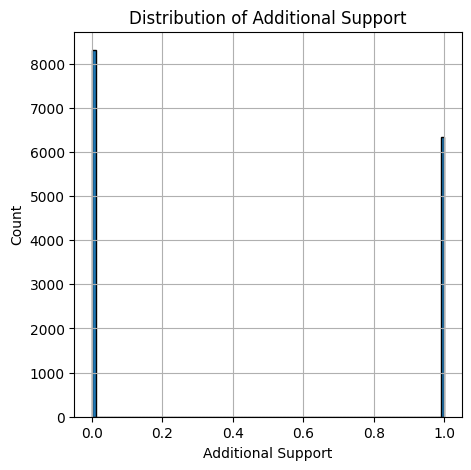

In [ ]:
plt.figure(figsize=(5, 5))  # Set the size of the plot
plt.hist(score_df['add_support'], bins=100, edgecolor='black')
plt.xlabel('Additional Support')
plt.ylabel('Count')
plt.title('Distribution of Additional Support')  # Title for the plot
plt.grid(True)  # Add grid lines to the plot
plt.show()


**inference**
there are 14684 records for machine learning model, 8306 classified as no additional support is required and 6342 required additional support.

The sligh imbalance is acceptable for machine learning model. 44% requires additional support vs 56% doesn't.  Our classification need to perform better than at least 56% accuracy

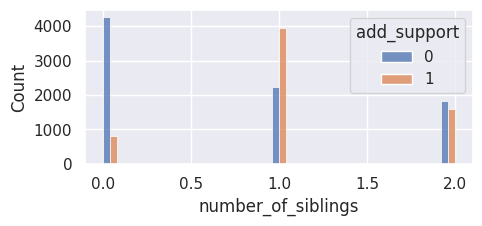

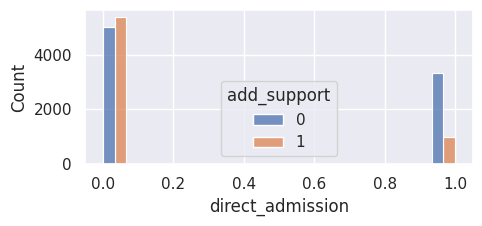

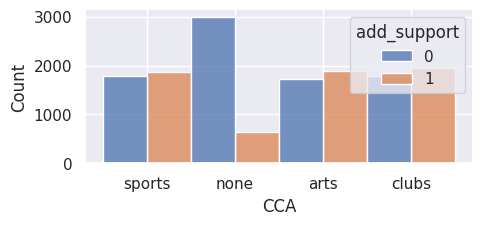

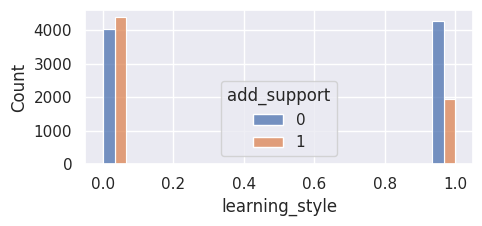

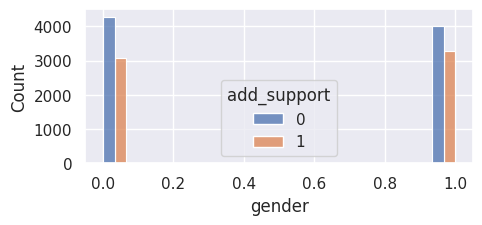

...

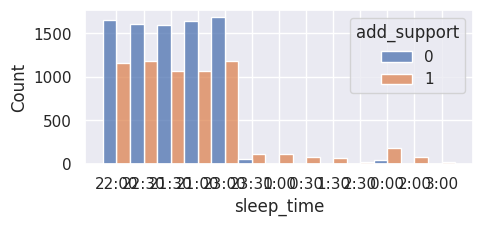

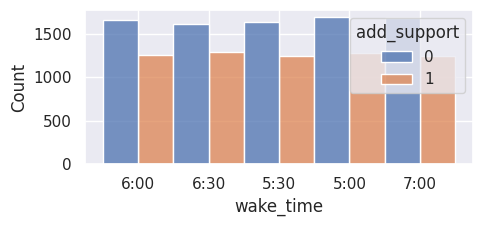

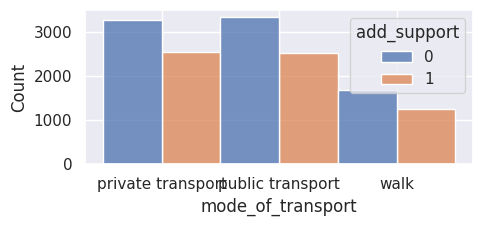

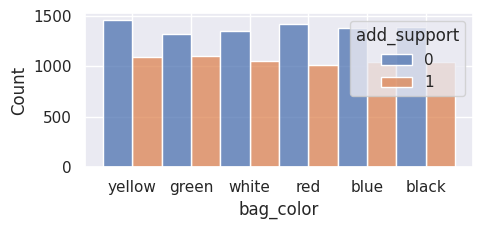

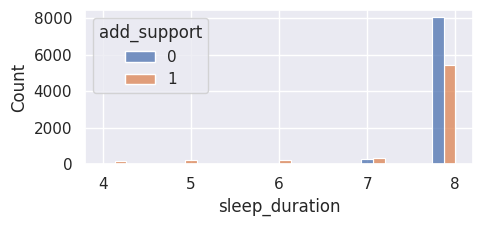

In [ ]:
sns.set(rc={'figure.figsize':(5,2)})

sns.histplot(x = "number_of_siblings", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "direct_admission", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "CCA", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "learning_style", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "gender", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "tuition", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "n_male", hue = "add_support", data = score_df, element="step")
plt.show()
sns.histplot(x = "n_female", hue = "add_support", data = score_df, element="step")
plt.show()
sns.histplot(x = "age", hue = "add_support", data = score_df, element="step")
plt.show()
sns.histplot(x = "hours_per_week", hue = "add_support", data = score_df, element="step")
plt.show()
sns.histplot(x = "attendance_rate", hue = "add_support", data = score_df, element="step")
plt.show()
sns.histplot(x = "sleep_time", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "wake_time", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "mode_of_transport", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "bag_color", hue = "add_support", data = score_df, multiple="dodge")
plt.show()
sns.histplot(x = "sleep_duration", hue = "add_support", data = score_df, multiple="dodge")
plt.show()

**inference**

Age has outlier and incorrect data (5,6,-4,-5). it will be removed

Attendance has steep cut off 90. will bucket records< 90 together as 89

Sleep time has steep cut off after 23.30, will bucket records after 23.30 together as 23.30

sleep_duration has 90% of the count at 8hours. It will not be a impactful feature for ML. it will be dropped

the rest of the feature does not have heavy imbalance.

In [ ]:
#bucket all attendance_rate below 90 to 89
score_df['attendance_rate'] = score_df.apply(lambda x: 89 if x['attendance_rate'] < 90 else x['attendance_rate'], axis=1)
print("attendance_rate : ",score_df['attendance_rate'].unique())

#bucket all sleep_time from 23.30 and beyond to 23.30
score_df['sleep_time'] = score_df.apply(lambda x: "23:30" if x['sleep_time'] in ["0:00","1:00","0:30","2:00","1:30","2:30","3:00"] else x['sleep_time'], axis=1)

#drop sleep_duration
score_df = score_df.drop(columns=['sleep_duration'])

# List of features for which you want to check and remove outliers
outlier_features_to_check = [ 'age']

# Calculate the IQR for each feature
Q1 = score_df[outlier_features_to_check].quantile(0.25)
Q3 = score_df[outlier_features_to_check].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers for each feature
outliers = ((score_df[outlier_features_to_check] < lower_bound) | (score_df[outlier_features_to_check] > upper_bound))

# Remove rows containing outliers
score_df_no_outliers = score_df[~outliers.any(axis=1)]

# Print the number of removed rows
print(f"Number of removed rows from age outlier: {len(score_df) - len(score_df_no_outliers)}")


print("age value: ",score_df_no_outliers['age'].unique())

print("attendance_rate value vs count: ",score_df_no_outliers.value_counts("attendance_rate"))


attendance_rate :  [ 91.  94.  92.  95.  96.  93.  97.  98.  90. 100.  89.  99.]
Number of removed rows from age outlier: 419
age value:  [16. 15.]
attendance_rate value vs count:  attendance_rate
97.0     1403
99.0     1354
96.0     1351
93.0     1336
98.0     1326
94.0     1321
95.0     1319
91.0     1303
92.0     1267
89.0      908
90.0      688
100.0     653
dtype: int64


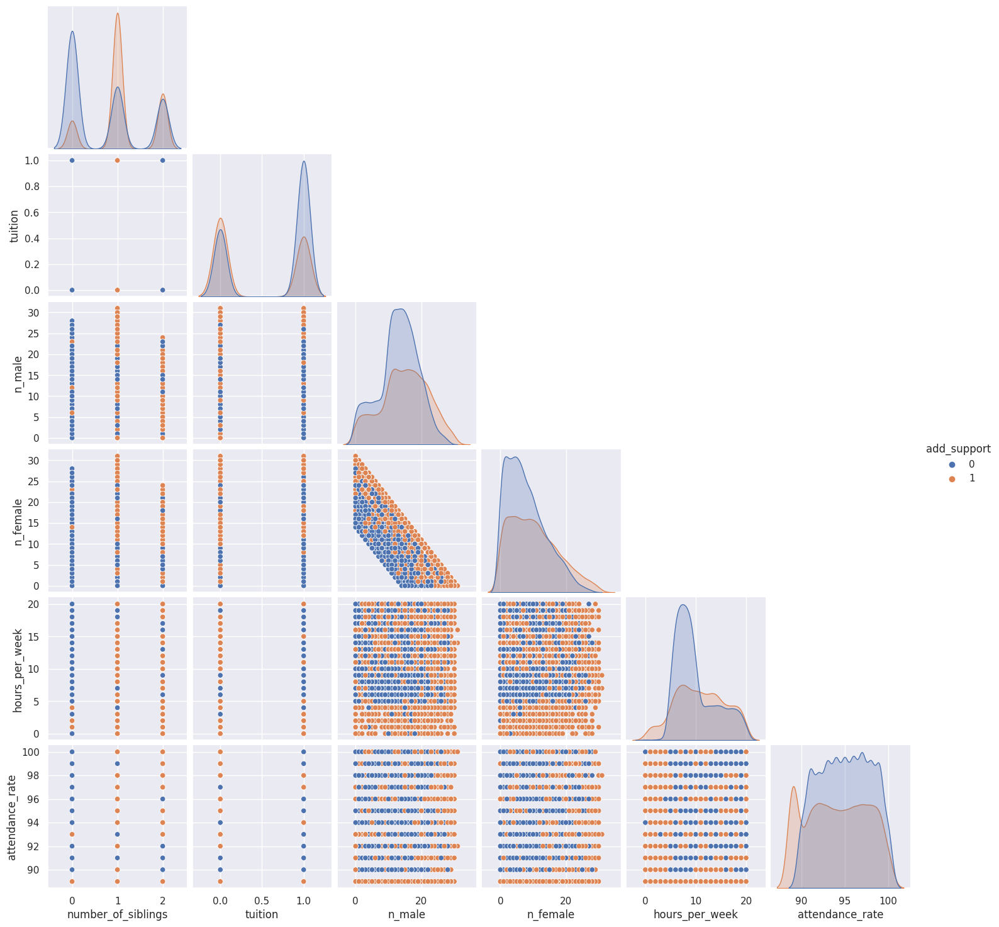

In [ ]:
sns.pairplot(data=score_df_no_outliers[['number_of_siblings','tuition','n_male','n_female','hours_per_week','attendance_rate','add_support']], hue="add_support", corner=True)


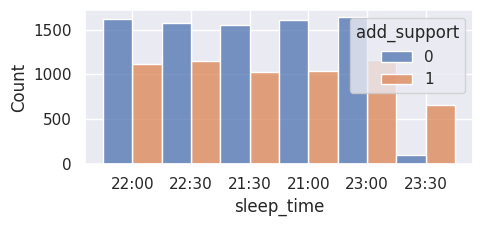

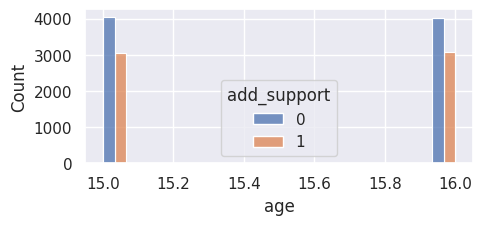

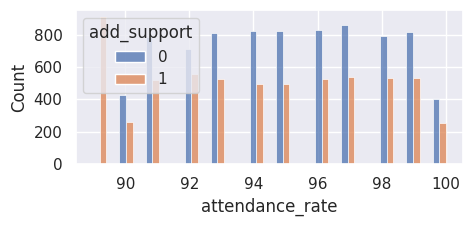

In [ ]:
#categorial sleep time check

sns.set(rc={'figure.figsize':(5,2)})
sns.histplot(x = "sleep_time", hue = "add_support", data = score_df_no_outliers, multiple="dodge")
plt.show()
sns.histplot(x = "age", hue = "add_support", data = score_df_no_outliers, multiple="dodge")
plt.show()
sns.histplot(x = "attendance_rate", hue = "add_support", data = score_df_no_outliers, multiple="dodge")
plt.show()

**inference**

Those with 1 sibilings higher propotion of requiring additional support, and those with 0 sibilings does not require additional support.

Those with lesser than 90 attendance_rate has higher propotion of requiring additional support

Those with higher N_female and N_Male has higher propotion of requiring additional support

Those with studies hours per weeks less than 5 has higher propotion of requiring additional support

Those sleep on 23.30 and after has higher propotion of requiring additional support

there seem to have inverse relation between N_female and N_Male.



In [ ]:
score_df_no_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14229 entries, 0 to 15899
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   number_of_siblings  14229 non-null  int64  
 1   direct_admission    14229 non-null  int64  
 2   CCA                 14229 non-null  object 
 3   learning_style      14229 non-null  int64  
 4   gender              14229 non-null  int64  
 5   tuition             14229 non-null  int64  
 6   n_male              14229 non-null  float64
 7   n_female            14229 non-null  float64
 8   age                 14229 non-null  float64
 9   hours_per_week      14229 non-null  float64
 10  attendance_rate     14229 non-null  float64
 11  sleep_time          14229 non-null  object 
 12  wake_time           14229 non-null  object 
 13  mode_of_transport   14229 non-null  object 
 14  bag_color           14229 non-null  object 
 15  add_support         14229 non-null  int64  
dtypes: f

<ipython-input-14-8072fd8743ea>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = score_df_no_outliers.corr()


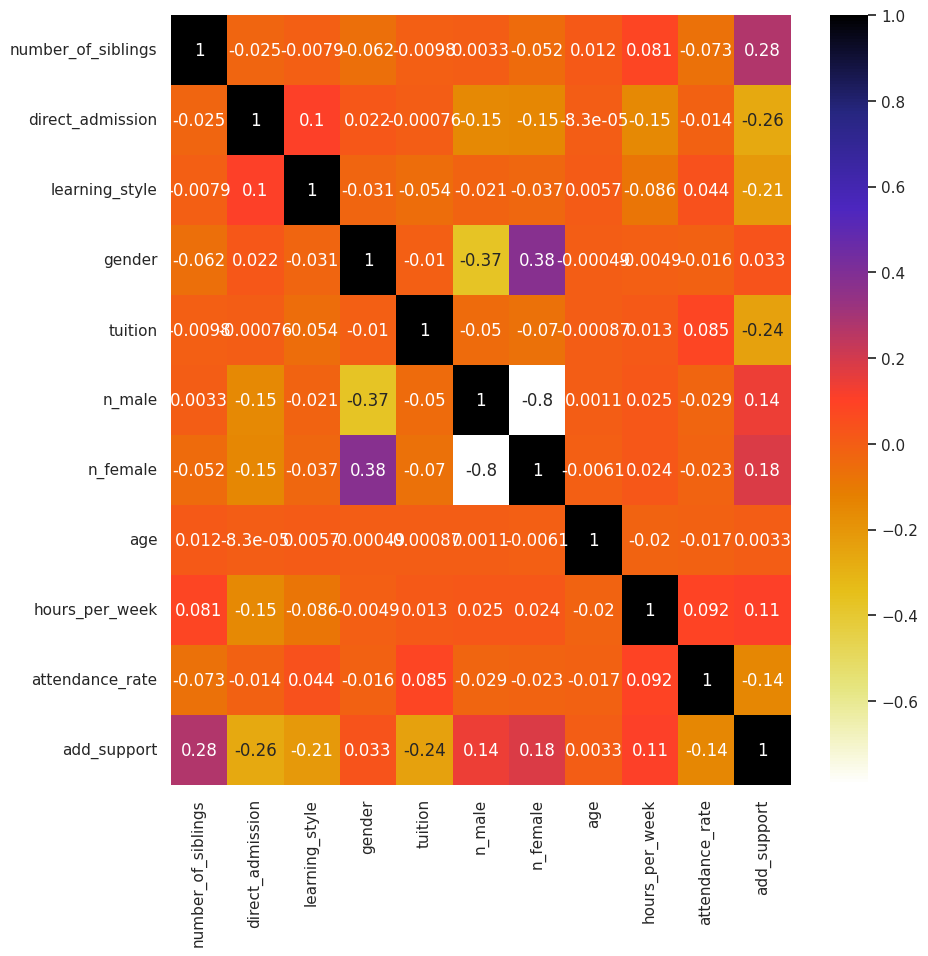

add_support           1.000000
number_of_siblings    0.276072
n_female              0.181618
n_male                0.137365
hours_per_week        0.106389
gender                0.032656
age                   0.003286
attendance_rate      -0.144869
learning_style       -0.207154
tuition              -0.236190
direct_admission     -0.264201
Name: add_support, dtype: float64


In [ ]:
corr_matrix = score_df_no_outliers.corr()

plt.figure(figsize=(10,10))
sns.heatmap(corr_matrix, cmap=plt.cm.CMRmap_r,annot=True)
plt.show()

print(corr_matrix['add_support'].sort_values(ascending=False))

###Data Cleaning Summary

1. 90% of sleep_duration is at 8 hours, highly imbalanced hence removed
2. Age has outlier and incorrect data (5,6,-4,-5) are removed
3. Attendance has steep cut off 90, bucketed records< 90 together as 89
4. Sleep time has steep cut off after 23.30, bucketed records after 23.30 together as 23.30
4. no multicollinearity observed among the features
5. no imbalance of features


###EDA Summary

1. target label add_support is considerably balance. acceptable for modelling
2. Those with 1 sibilings higher propotion of requiring additional support, and those with 0 sibilings does not require additional support.

3. Those with lesser than 90 attendance_rate has higher propotion of requiring additional support

4. Those with higher N_female and N_Male has higher propotion of requiring additional support

5. Those with studies hours per weeks less than 5 has higher propotion of requiring additional support

6. Those sleep on 23.30 and after has higher propotion of requiring additional support

7. there seem to have  relation between N_female and N_Male.
8. there seem to have relation between number_of siblings,learning_style, tuition, direction_admission and add_support
9. No significance multicollinearity observed among the features
10. No significance imbalance of features observed

The Dataset structure and distribution is useable for Machine learning training.

---



In [ ]:
score_df_no_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14229 entries, 0 to 15899
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   number_of_siblings  14229 non-null  int64  
 1   direct_admission    14229 non-null  int64  
 2   CCA                 14229 non-null  object 
 3   learning_style      14229 non-null  int64  
 4   gender              14229 non-null  int64  
 5   tuition             14229 non-null  int64  
 6   n_male              14229 non-null  float64
 7   n_female            14229 non-null  float64
 8   age                 14229 non-null  float64
 9   hours_per_week      14229 non-null  float64
 10  attendance_rate     14229 non-null  float64
 11  sleep_time          14229 non-null  object 
 12  wake_time           14229 non-null  object 
 13  mode_of_transport   14229 non-null  object 
 14  bag_color           14229 non-null  object 
 15  add_support         14229 non-null  int64  
dtypes: f

# 4. Data Pre-Processing

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

#direct_admission, learning_style, gender, tuition are binary has been converted to 1 and 0. not required for one-hot endoced
# Columns to be one-hot encoded
categorical_columns = ['CCA','mode_of_transport','bag_color','sleep_time','wake_time']

# Columns to be standardized
numeric_columns = ['number_of_siblings', 'n_male','n_female','age','hours_per_week','attendance_rate']


# Create a pipeline for data preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_columns),
        ('num', StandardScaler(), numeric_columns)],
    remainder='passthrough')

# Fit and transform the data using the pipeline
song_transformed = preprocessor.fit_transform(score_df_no_outliers)

# Convert the transformed data back to a DataFrame (optional)
score_encoded = pd.DataFrame(song_transformed, columns=preprocessor.get_feature_names_out(input_features=score_df_no_outliers.columns))

score_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14229 entries, 0 to 14228
Data columns (total 35 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   cat__CCA_arts                             14229 non-null  float64
 1   cat__CCA_clubs                            14229 non-null  float64
 2   cat__CCA_none                             14229 non-null  float64
 3   cat__CCA_sports                           14229 non-null  float64
 4   cat__mode_of_transport_private transport  14229 non-null  float64
 5   cat__mode_of_transport_public transport   14229 non-null  float64
 6   cat__mode_of_transport_walk               14229 non-null  float64
 7   cat__bag_color_black                      14229 non-null  float64
 8   cat__bag_color_blue                       14229 non-null  float64
 9   cat__bag_color_green                      14229 non-null  float64
 10  cat__bag_color_red                

In [ ]:
score_encoded.head(3)

,cat__CCA_arts,cat__CCA_clubs,cat__CCA_none,cat__CCA_sports,cat__mode_of_transport_private transport,cat__mode_of_transport_public transport,cat__mode_of_transport_walk,cat__bag_color_black,cat__bag_color_blue,cat__bag_color_green,...,num__n_male,num__n_female,num__age,num__hours_per_week,num__attendance_rate,remainder__direct_admission,remainder__learning_style,remainder__gender,remainder__tuition,remainder__add_support
0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.020464,-1.035438,1.000351,-0.070823,-1.145682,1.0,1.0,1.0,0.0,0.0
1,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,...,-1.506479,1.509371,1.000351,-0.742649,-0.202248,0.0,0.0,1.0,0.0,1.0
2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.020464,-1.035438,-0.999649,-0.518707,-0.831204,1.0,1.0,0.0,0.0,0.0


#5. Dataset split for training, validation, testing and final t-test


In [ ]:
from sklearn.model_selection import train_test_split
import numpy as np

X = score_encoded.iloc[:,0:-1]
y = score_encoded.iloc[:,-1:]
y = y['remainder__add_support'].values.ravel()

X_temp, X_train, y_temp, y_train = train_test_split(X, y, test_size=0.75, random_state=42) # train test for training

X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.3, random_state=42) #train test for validation 70% and test 30%

print("X_train",X_train.shape)
print("y_train",y_train.shape)

print("X_val",X_val.shape)
print("y_val",y_val.shape)

print("X_test",X_test.shape)
print("y_test",y_test.shape)

#print("X_ttest",X_ttest.head(1))
#print("y_ttest",y_ttest.head(1))
#print("X_train",X_train.head(1))
#print("y_train",y_train.head(1))

#print("X_val",X_val.head(1))
#print("y_val",y_val.head(1))
#print("X_test",X_test.head(1))
#print("y_test",y_test.head(1))

X_train (10672, 34)
y_train (10672,)
X_val (2489, 34)
y_val (2489,)
X_test (1068, 34)
y_test (1068,)


In [ ]:
X_train.head(5)

,cat__CCA_arts,cat__CCA_clubs,cat__CCA_none,cat__CCA_sports,cat__mode_of_transport_private transport,cat__mode_of_transport_public transport,cat__mode_of_transport_walk,cat__bag_color_black,cat__bag_color_blue,cat__bag_color_green,...,num__number_of_siblings,num__n_male,num__n_female,num__age,num__hours_per_week,num__attendance_rate,remainder__direct_admission,remainder__learning_style,remainder__gender,remainder__tuition
4250,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-1.176795,-1.353784,0.910592,1.000351,0.601003,1.684620,0.0,0.0,1.0,0.0
12591,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.152881,1.700102,-0.586354,-0.999649,1.048887,1.370142,0.0,1.0,0.0,0.0
8446,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.152881,0.631242,-0.436659,1.000351,0.377061,-1.460160,0.0,0.0,0.0,1.0
11378,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.152881,-1.048396,0.910592,-0.999649,1.720713,1.370142,0.0,0.0,1.0,1.0
10208,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.152881,2.005490,-0.736048,1.000351,1.496771,-0.831204,0.0,0.0,0.0,0.0


In [ ]:
print(y_train)

[0. 1. 1. ... 0. 0. 1.]


#6. Modelling

---


### Hueristic Modelling for Baseline

Supervised Random Forest classification model will be used for Hueristic Modelling

**Base classical models**


In [ ]:
score_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14229 entries, 0 to 14228
Data columns (total 35 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   cat__CCA_arts                             14229 non-null  float64
 1   cat__CCA_clubs                            14229 non-null  float64
 2   cat__CCA_none                             14229 non-null  float64
 3   cat__CCA_sports                           14229 non-null  float64
 4   cat__mode_of_transport_private transport  14229 non-null  float64
 5   cat__mode_of_transport_public transport   14229 non-null  float64
 6   cat__mode_of_transport_walk               14229 non-null  float64
 7   cat__bag_color_black                      14229 non-null  float64
 8   cat__bag_color_blue                       14229 non-null  float64
 9   cat__bag_color_green                      14229 non-null  float64
 10  cat__bag_color_red                

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.model_selection import GridSearchCV

# Set a random seed for reproducibility
np.random.seed(512)

# Create a Random Forest classifier
rf = RandomForestClassifier(random_state=512)
# Define the hyperparameters to search through
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 5, 10, 15]
}

# Create GridSearchCV
grid_search = GridSearchCV(rf, param_grid, cv=3, scoring='accuracy')

# Fit the model using GridSearch
grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_


# Make predictions using the best estimator
y_pred = best_estimator.predict(X_val)

# Calculate evaluation metrics
accuracy = accuracy_score(y_val , y_pred)
precision = precision_score(y_val , y_pred)
recall = recall_score(y_val , y_pred)
f1 = f1_score(y_val , y_pred)

# Print evaluation metrics
print("best_params: ", best_params)
print("best_estimator: ", best_estimator)

print("Accuracy: %.2f" % accuracy)
print("Precision: %.2f" % precision)
print("Recall: %.2f" % recall)
print("F1 Score: %.2f" % f1)

# Generate a classification report for more detailed metrics
class_report = classification_report(y_val, y_pred)
print("\nClassification Report:\n", class_report)

best_params:  {'max_depth': 15, 'n_estimators': 100}
best_estimator:  RandomForestClassifier(max_depth=15, random_state=512)
Accuracy: 0.82
Precision: 0.81
Recall: 0.78
F1 Score: 0.79

Classification Report:
               precision    recall  f1-score   support

         0.0       0.83      0.86      0.84      1409
         1.0       0.81      0.78      0.79      1080

    accuracy                           0.82      2489
   macro avg       0.82      0.82      0.82      2489
weighted avg       0.82      0.82      0.82      2489



The recall for 1.0 require additional support is rather low at 78. For this case, it is ok for lower precision but it is curical for a higher recall score.

 We dont want to miss out student that require help.

 will lower the model threshold to increase recall for precision


In [ ]:
# Lower the threshold (from 0.5 to 0.4)
new_threshold = 0.45

# Predict probabilities for the positive class
y_probabilities = best_estimator.predict_proba(X_val)[:, 1]

# Reclassify based on the new threshold
y_pred_t = (y_probabilities >= new_threshold).astype(int)

# Print evaluation metrics
print("best_params: ", best_params)
print("best_estimator: ", best_estimator)

# Calculate evaluation metrics
accuracy = accuracy_score(y_val , y_pred_t)
precision = precision_score(y_val , y_pred_t)
recall = recall_score(y_val , y_pred_t)
f1 = f1_score(y_val , y_pred_t)

print("Accuracy: %.2f" % accuracy)
print("Precision: %.2f" % precision)
print("Recall: %.2f" % recall)
print("F1 Score: %.2f" % f1)
print("New threshold", new_threshold)
# Generate a classification report for more detailed metrics
class_report = classification_report(y_val, y_pred_t)
print("\nClassification Report:\n", class_report)

best_params:  {'max_depth': 15, 'n_estimators': 100}
best_estimator:  RandomForestClassifier(max_depth=15, random_state=512)
Accuracy: 0.82
Precision: 0.77
Recall: 0.83
F1 Score: 0.80
New threshold 0.45

Classification Report:
               precision    recall  f1-score   support

         0.0       0.86      0.82      0.84      1409
         1.0       0.77      0.83      0.80      1080

    accuracy                           0.82      2489
   macro avg       0.82      0.82      0.82      2489
weighted avg       0.82      0.82      0.82      2489



**inference**
with threshold of 0.45. both Precision and Recall seem balance with total F1 score of 0.82.

this will be the Classical model for hueristic


best_params:  {'max_depth': 15, 'n_estimators': 100}
best_estimator:  RandomForestClassifier(max_depth=15, random_state=42)
Accuracy: 0.82
Precision: 0.78
Recall: **0.83**
F1 Score: 0.80

Classification Report:
               precision    recall  f1-score   support

         0.0       0.86      0.82      0.84      1409
         1.0       0.78      0.83      0.80      1080

    accuracy                           0.82      2489
   macro avg       0.82      0.83      0.82      2489
   
weighted avg       0.83      0.82      0.82      2489


---


### Feed Forward Fully connected Neural Network


In [ ]:
pip install keras-tuner --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 3.2 MB/s eta 0:00:00


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score
from kerastuner.tuners import RandomSearch, Hyperband
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ReduceLROnPlateau
from keras_tuner import Objective
import shutil

# uncomment this to run new hypermeter search. Delete the existing tuner directory to search for new

shutil.rmtree('logs/tuner_logs', ignore_errors=True)
shutil.rmtree('tuner_results/', ignore_errors=True)


#for Reproducibility
# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) `tensorflow` random seed
# 3) `python` random seed
keras.utils.set_random_seed(512)

# This will make TensorFlow ops as deterministic as possible, but it will
# affect the overall performance, so it's not enabled by default.
# `enable_op_determinism()` is introduced in TensorFlow 2.9.
tf.config.experimental.enable_op_determinism()


# Define a function to build a model for Keras Tuner
def build_model(hp):
    model = keras.Sequential()
    model.add(layers.Input(shape=(X_train.shape[1],)))

    #define optimizer and learning rate list of value
    hp_optimizer = hp.Choice('optimizer', values=['adam', 'rmsprop']) #, 'SGD'
    hp_learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-1, sampling='log') # turn off learning_rate hyper tuning as it produce odd result

    # Add a tunable hyperparameter for batch size
    hp_batch_size = hp.Int('batch_size', min_value=32, max_value=512, step=32)

    # Choose optimizer based on hyperparameter
    optimizer = None
    if hp_optimizer == 'adam':
        optimizer1 = keras.optimizers.Adam(learning_rate=hp_learning_rate)
        #optimizer1 = keras.optimizers.Adam()
    elif hp_optimizer == 'rmsprop':
        #optimizer1 = keras.optimizers.RMSprop()
        optimizer1 = keras.optimizers.RMSprop(learning_rate=hp_learning_rate)

    #elif hp_optimizer == 'SGD': #does not produce good result
        #optimizer1 = keras.optimizers.SGD(learning_rate=hp_learning_rate)

    # Tune the number of hidden layers up to 4 layes
    for i in range(hp.Int('num_layers', min_value=1, max_value=4)):
        # Tune the number of units in each layer
        units = hp.Int(f'units_{i}', min_value=32, max_value=512, step=32)

        # Add L2 regularization to the dense layers
        model.add(layers.Dense(units=units, activation='relu', kernel_regularizer=keras.regularizers.l2(0.01)))

    model.add(layers.Dense(1, activation='sigmoid', kernel_regularizer=keras.regularizers.l2(0.01)))

    # Compile the model with hyperparameters and set "recall" as the metric
    model.compile(optimizer=optimizer1,
                  loss='binary_crossentropy',
                  metrics=[tf.keras.metrics.Recall(name='recall')])

    return model

# Initialize a RandomSearch tuner with Objective, difference between RandomSearch and hyperband available in appendix section
tuner = Hyperband(
    build_model,
    objective=Objective("val_recall", direction="max"),  # Use "max" for maximizing recall
    seed=42,
    max_epochs=70,
    factor=3,
    directory='tuner_results',
    project_name='classification_tuning')

# Create a TensorBoard callback
tensorboard_callback = TensorBoard(log_dir='logs/tuner_logs', histogram_freq=1)

# Create an EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Create a ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7)

# Search for the best hyperparameters
tuner.search(X_train, y_train, epochs=10, validation_data=(X_val, y_val), callbacks=[tensorboard_callback, early_stopping, reduce_lr])

# Get the best hyperparameters
best_hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the best model based on the best hyperparameters
best_model = tuner.hypermodel.build(best_hyperparameters)

# Fit the best model with a fixed number of epochs (e.g., 20) and X_train, y_train
best_model.fit(X_train, y_train, epochs=20, validation_data=(X_val, y_val))

# Evaluate the best model on the test data, with threshold of 0.5
y_pred = best_model.predict(X_val)
y_pred_binary = (y_pred > 0.5).astype(int)

# Calculate recall, precision, and F1 score
recall = recall_score(y_val, y_pred_binary)
precision = precision_score(y_val, y_pred_binary)
f1 = f1_score(y_val, y_pred_binary)

# Print the best model and hyperparameters
print("Best Model:")
print(best_model.summary())
print("\nBest Hyperparameters:")
print(best_hyperparameters.values)

# Print evaluation results
print("\nEvaluation Results:")
print("Test Recall:", recall)
print("Test Precision:", precision)
print("Test F1 Score:", f1)


Trial 90 Complete [00h 05m 33s]
val_recall: 0.8324074149131775

Best val_recall So Far: 0.9342592358589172
Total elapsed time: 00h 47m 06s
Epoch 1/20
334/334 [==============================] - 3s 5ms/step - loss: 0.8217 - recall: 0.7283 - val_loss: 0.5771 - val_recall: 0.9130
Epoch 2/20
334/334 [==============================] - 1s 4ms/step - loss: 0.5393 - recall: 0.7590 - val_loss: 0.5564 - val_recall: 0.6056
Epoch 3/20
334/334 [==============================] - 2s 6ms/step - loss: 0.5339 - recall: 0.7503 - val_loss: 0.5560 - val_recall: 0.5843
Epoch 4/20
334/334 [==============================] - 2s 7ms/step - loss: 0.5301 - recall: 0.7521 - val_loss: 0.5446 - val_recall: 0.8370
Epoch 5/20
334/334 [==============================] - 2s 5ms/step - loss: 0.5327 - recall: 0.7542 - val_loss: 0.5205 - val_recall: 0.7046
Epoch 6/20
334/334 [==============================] - 1s 4ms/step - loss: 0.5227 - recall: 0.7477 - val_loss: 0.5431 - val_recall: 0.6398
Epoch 7/20
334/334 [=============

took 1hr. for 100 trials
Best Model: trial run 062
Model: "sequential_1"
_________________________________________________________________
 |Layer (type)      |          Output Shape    |          Param #   |
|--|--|--|
 dense_5 (Dense)   |          (None, 448)   |            15680      
 dense_6 (Dense)    |         (None, 160)      |          71840      
 dense_7 (Dense)     |        (None, 352)     |         56672     
 dense_8 (Dense)     |        (None, 1)       |          481       
                                                                 
Total params: 144545 (564.63 KB)

Trainable params: 144545 (564.63 KB)

Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


Best Hyperparameters:
{'optimizer': 'adam', 'learning_rate': 0.047695037774735986, 'batch_size': 288, 'num_layers': 3, 'units_0': 448, 'units_1': 160, 'units_2': 352, 'units_3': 192, 'tuner/epochs': 3, 'tuner/initial_epoch': 0, 'tuner/bracket': 3, 'tuner/round': 0}

Evaluation Results:

Test Recall: 0.7277777777777777

Test Precision: 0.7464387464387464

Test F1 Score: 0.7369901547116736


In [ ]:
!kill $(ps -e | grep 'tensorboard' | awk '{print $1}')

kill: usage: kill [-s sigspec | -n signum | -sigspec] pid | jobspec ... or kill -l [sigspec]


In [ ]:
import os
best_trial_id = tuner.oracle.get_best_trials(1)[0].trial_id
print("best_trial_id:" , best_trial_id)
%load_ext tensorboard
# Please ignore the error page in the output and go to the next cell
%tensorboard --logdir ./logs/tuner_logs/"$best_trial_id" --host=127.0.0.1 --port=6006 --load_fast=false
# Access tensorboard via colab's proxy
# Click the link that appears in the output
from google.colab import output
output.serve_kernel_port_as_window(6006, path="")

**Inference**


the best run id is job 024.

Best val_recall So Far: 0.9342592358589172

Test Recall: 0.7277777777777777

Test Precision: 0.7464387464387464

Test F1 Score: 0.7369901547116736

overfitting occurs, and model is not able to generalize

we will use the Best Hyperparameters as the starting point to start tuning the FFNN model: {'optimizer': 'adam', 'learning_rate': 0.047695037774735986, 'batch_size': 288, 'num_layers': 3, 'units_0': 448, 'units_1': 160, 'units_2': 352, 'units_3': 192, 'tuner/epochs': 3, 'tuner/initial_epoch': 0, 'tuner/bracket': 3, 'tuner/round': 0}





In [ ]:
#to view best hyperparameters
param_list=best_hyperparameters.values
print(param_list)

{'optimizer': 'adam', 'learning_rate': 0.047695037774735986, 'batch_size': 288, 'num_layers': 3, 'units_0': 448, 'units_1': 160, 'units_2': 352, 'units_3': 192, 'tuner/epochs': 3, 'tuner/initial_epoch': 0, 'tuner/bracket': 3, 'tuner/round': 0}


In [ ]:
#build a new FFNN model with best hyperparameter and use drop off for overfitting
from tensorflow.keras import regularizers


shutil.rmtree('logs_T', ignore_errors=True)

# Hyperparameters to dict
param_list=best_hyperparameters.values

optimizer = param_list['optimizer']
batch_size = param_list['batch_size']
num_layers = param_list['num_layers']
learning_rate= param_list['learning_rate']

units = [best_hyperparameters[f'units_{i}'] for i in range(num_layers)]

# Build the model
model_t = keras.Sequential()
model_t.add(layers.Input(shape=(X_train.shape[1],)))
for i in range(num_layers):
    model_t.add(layers.Dense(units=units[i], activation='relu', kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
    bias_regularizer=regularizers.L2(1e-4),
    activity_regularizer=regularizers.L2(1e-5)))
    model_t.add(layers.Dropout(0.5))  # to try out adjusting this

model_t.add(layers.Dense(1, activation='sigmoid'))

model_t.compile(
    #optimizer=optimizer,
    optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
    loss='binary_crossentropy',
    metrics=[tf.keras.metrics.Recall(name='recall')]
)

# Early stopping & tensorboard callback & reduce_lr
#removed early stopping for better result
#early_stopping = EarlyStopping(monitor='val_recall', patience=50,restore_best_weights=True). # this is seem to be stuck in local minimum, preventing global miniuim at 160 epoch

# Create a ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7)

# Create a tensorboard callback
tensorboard = TensorBoard(log_dir='./logs_T', histogram_freq=1, write_graph=True, write_images=True)

# Train the model with early stopping
history = model_t.fit(
    X_train, y_train,
    epochs=200,
    batch_size=batch_size,
    validation_data=(X_val, y_val),
    callbacks=[tensorboard,reduce_lr]
)

# Evaluate the best model on the test data, with threshold of 0.5
y_pred = model_t.predict(X_val)
y_pred_binary = (y_pred > 0.5).astype(int)

# Calculate recall, precision, and F1 score
recall = recall_score(y_val, y_pred_binary)
precision = precision_score(y_val, y_pred_binary)
f1 = f1_score(y_val, y_pred_binary)

# Print the best model and hyperparameters
print("Best Model:")
print(model_t.summary())


# Print evaluation results
print("\nEvaluation Results:")
print("Test Recall:", recall)
print("Test Precision:", precision)
print("Test F1 Score:", f1)

Epoch 1/200
38/38 [==============================] - 2s 26ms/step - loss: 1.7924 - recall: 0.4412 - val_loss: 1.1106 - val_recall: 0.5981 - lr: 0.0477
Epoch 2/200
38/38 [==============================] - 1s 18ms/step - loss: 1.0438 - recall: 0.6137 - val_loss: 0.8962 - val_recall: 0.7093 - lr: 0.0477
Epoch 3/200
38/38 [==============================] - 1s 25ms/step - loss: 0.8847 - recall: 0.6514 - val_loss: 0.8221 - val_recall: 0.3880 - lr: 0.0477
Epoch 4/200
38/38 [==============================] - 1s 29ms/step - loss: 0.8074 - recall: 0.6338 - val_loss: 0.6959 - val_recall: 0.7324 - lr: 0.0477
Epoch 5/200
38/38 [==============================] - 1s 28ms/step - loss: 0.7325 - recall: 0.6691 - val_loss: 0.6599 - val_recall: 0.5704 - lr: 0.0477
Epoch 6/200
38/38 [==============================] - 1s 31ms/step - loss: 0.7064 - recall: 0.5996 - val_loss: 0.6277 - val_recall: 0.6898 - lr: 0.0477
Epoch 7/200
38/38 [==============================] - 1s 20ms/step - loss: 0.6763 - recall: 0.6

Best Model:
Model: "sequential_8"

 |Layer (type)     |           Output Shape    |          Param #  |
|--|--|--|
 dense_32 (Dense)       |     (None, 448)        |       15680      
 dropout_15 (Dropout)  |      (None, 448)     |          0         
 dense_33 (Dense)      |      (None, 160)       |         71840      
 dropout_16 (Dropout)   |     (None, 160)        |        0         
 dense_34 (Dense)      |      (None, 352)       |        56672     
 dropout_17 (Dropout)   |     (None, 352)       |        0         
 dense_35 (Dense)      |      (None, 1)      |         353    
   
                                                                 
Total params: 144545 (564.63 KB)
Trainable params: 144545 (564.63 KB)
Non-trainable params: 0 (0.00 Byte)

Evaluation Results:
Test Recall: 0.8638888888888889

Test Precision: 0.7920203735144312

Test F1 Score: 0.8263950398582817

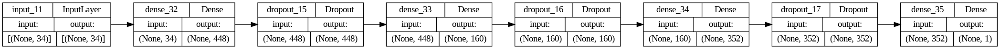

In [ ]:
tf.keras.utils.plot_model(model_t, show_shapes=True, rankdir="LR")

In [ ]:
!kill $(ps -e | grep 'tensorboard' | awk '{print $1}')

kill: usage: kill [-s sigspec | -n signum | -sigspec] pid | jobspec ... or kill -l [sigspec]


In [ ]:
%load_ext tensorboard
#%tensorboard --logdir logs
# Please ignore the error page in the output and go to the next cell
%tensorboard --logdir ./logs_T --host=127.0.0.1 --port=6006 --load_fast=false
# Access tensorboard via colab's proxy
# Click the link that appears in the output
from google.colab import output
output.serve_kernel_port_as_window(6006, path="")



The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Inference**

The training loss and accuracy consistently improve over epochs, The model is learning well from the training data, and the weights are adjusting to improve accuracy and reduce loss

Both training and validation accuracies are high and similar.The model is learning well from the training data and generalizing effectively to the validation set

Test result is also promising.
Test Recall: 0.8138888888888889

Test Precision: 0.7869292748433303

Test F1 Score: 0.8001820664542558

this will be the FF model to compare against Random forest





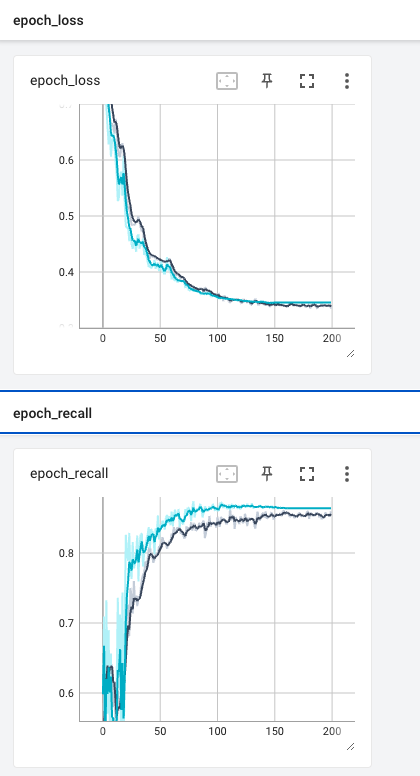

#McNemar's statistic T-test
for model difference significance
[classifier test reference](https://towardsdatascience.com/mcnemars-test-to-evaluate-machine-learning-classifiers-with-python-9f26191e1a6b#:~:text=McNemar's%20test,have%20a%20lot%20of%20data.)

In [ ]:
#Ground truth
ground_truth = y_test

# Prediction for random forest, Reclassify based on the new threshold= 0.45
y_probabilities = best_estimator.predict_proba(X_test)[:, 1]
predictions_model_RF = (y_probabilities >= new_threshold).astype(int)

# Prediction for FFN
y_pred = model_t.predict(X_test)
predictions_model_B_FFNN = (y_pred > 0.5).astype(int)

# Initialize the contingency table values
a = b = c = d = 0

# Calculate the contingency table values
for i in range(len(predictions_model_RF)):
    prediction_A = predictions_model_RF[i]
    prediction_B = predictions_model_B_FFNN[i]
    true_label = ground_truth[i]

    if prediction_A == true_label and prediction_B == true_label:
        a += 1
    elif prediction_A == true_label and prediction_B != true_label:
        b += 1
    elif prediction_A != true_label and prediction_B == true_label:
        c += 1
    elif prediction_A != true_label and prediction_B != true_label:
        d += 1

# Calculate McNemar's statistic
statistic = ((b - c) ** 2) / (b + c)

print("a: ",a)
print("b: ",b)
print("c: ",c)
print("d: ",d)
# Calculate the p-value using a chi-squared distribution
from scipy.stats import chi2
p_value = 1 - chi2.cdf(statistic, df=1)
print("p_value: ",p_value)
# Check the p-value to determine statistical significance
alpha = 0.05  # Set your significance level
if p_value < alpha:
    print("There is a significant difference in prediction performance between the two models.")
else:
    print("There is no significant difference in prediction performance between the two models.")


34/34 [==============================] - 0s 3ms/step
a:  864
b:  26
c:  68
d:  110
p_value:  1.4778159579509342e-05
There is a significant difference in prediction performance between the two models.


total test records- 1068 records (595(label=0) 473(label=1))
method 1 is random forest
method 2 is FF neural network

a:  864 Instances of true correctly classified by both methods

b:  26 Instances misclassified by the second method but correctly classified by the first method

c:  68 Instances misclassified by the first method but correctly classified by the second method.

d:  110 Instances of false correctly classified by both methods

p_value:  1.4778159579509342e-05 < alpha = 0.05

There is a significant difference in prediction performance between the two models.

**inference**
Feed forward neural network perform better than classical machine learning random forest

# SHAP for Machine Learning Interpretability


[SHAP reference](https://www.datacamp.com/tutorial/introduction-to-shap-values-machine-learning-interpretability)


[SHAP computationally expensive for Neural Networks](https://www.yourdatateacher.com/2021/05/17/how-to-explain-neural-networks-using-shap/)

Application of SHAP Values
Apart from machine learning interpretability and explainability, SHAP value can be used for:

1. Model debugging. By examining the SHAP values, we can identify any biases or
outliers in the data that may be causing the model to make mistakes.

2. Feature importance. Identifying and removing low-impact features can create a more optimized model.

3. Anchoring explanations. We can use SHAP values to explain individual predictions by highlighting the essential features that caused that prediction. It can help users understand and trust a model's decisions.
4. Model summaries. It can provide a global summary of a model in the form of a SHAP value summary plot. It gives an overview of the most important features across the entire dataset.
5. Detecting biases. The SHAP value analysis helps identify if certain features disproportionately affect particular groups. It enables the detection and reduction of discrimination in the model.
6. Fairness auditing. It can be used to assess a model's fairness and ethical implications.
7. Regulatory approval. SHAP values can help gain regulatory approval by explaining the model's decisions.

In [ ]:
#pip install shap

In [ ]:
#import shap

##Feature importance for Random forest



In [ ]:
#explainer_rf = shap.Explainer(best_estimator)
#shap_values = explainer_rf.shap_values(X_test)

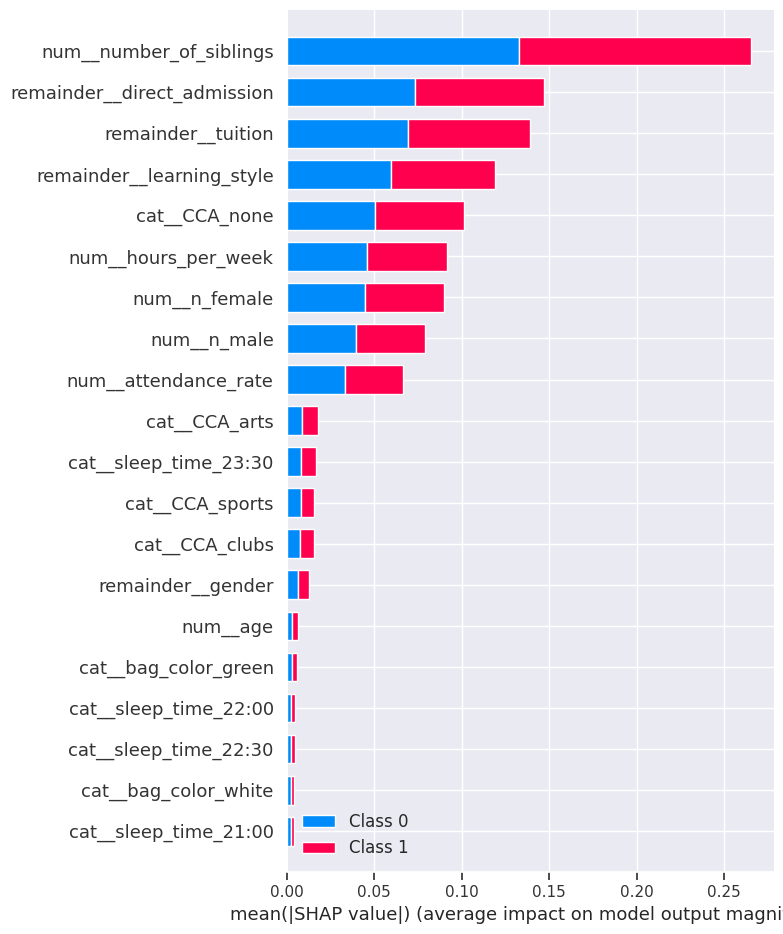

In [ ]:
#shap.summary_plot(shap_values, X_test)
#no bias observed

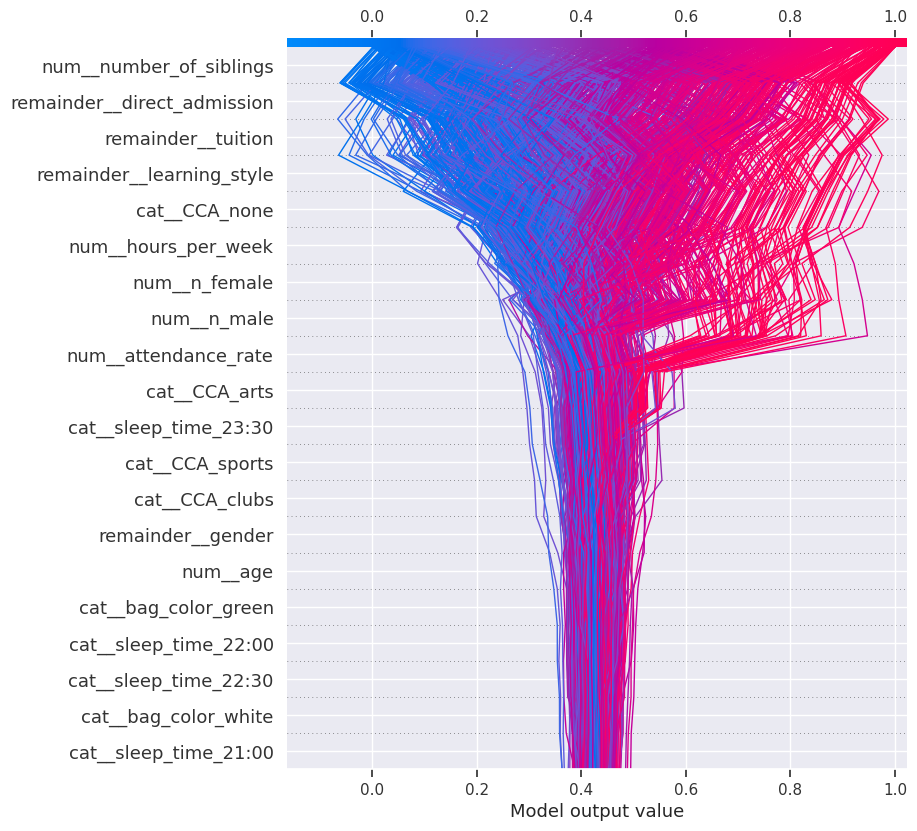

In [ ]:
#for classifer output of 1
#shap.decision_plot(explainer_rf.expected_value[1], shap_values[1], X_test.columns)

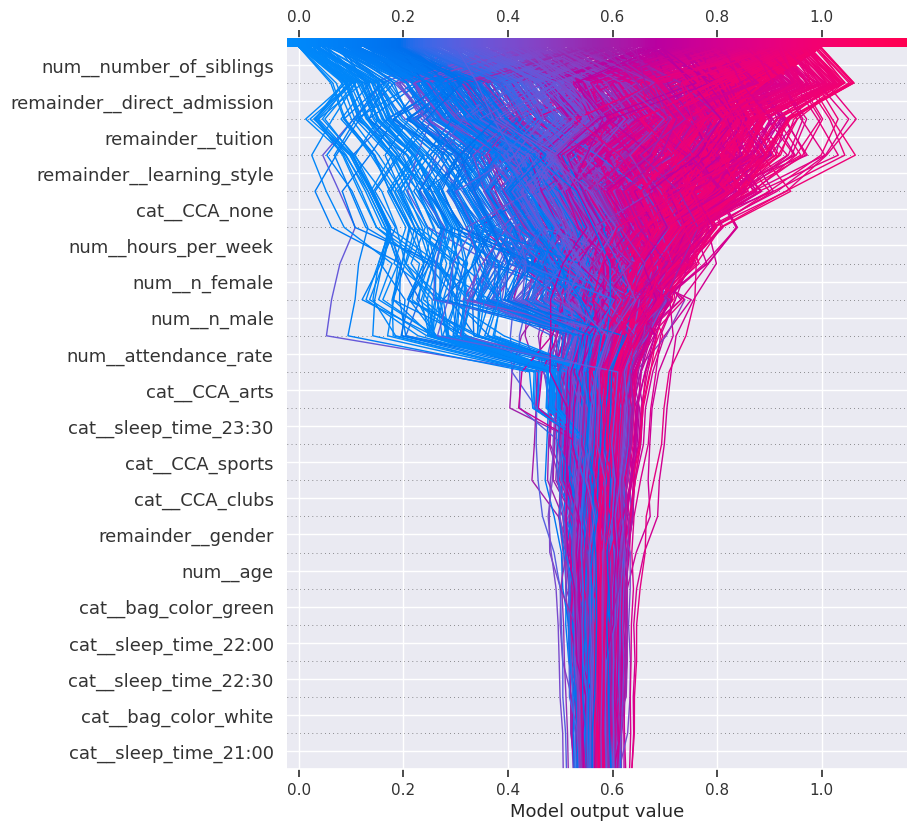

In [ ]:
#for classifer output of 0
#shap.decision_plot(explainer_rf.expected_value[0], shap_values[0], X_test.columns)

In [ ]:
#do not run this again
explainer_FFN = shap.Explainer(best_model.predict,X_test)
shap_values = explainer_FFN.shap_values(X_test)


In [ ]:
shap.summary_plot(shap_values, X_test)

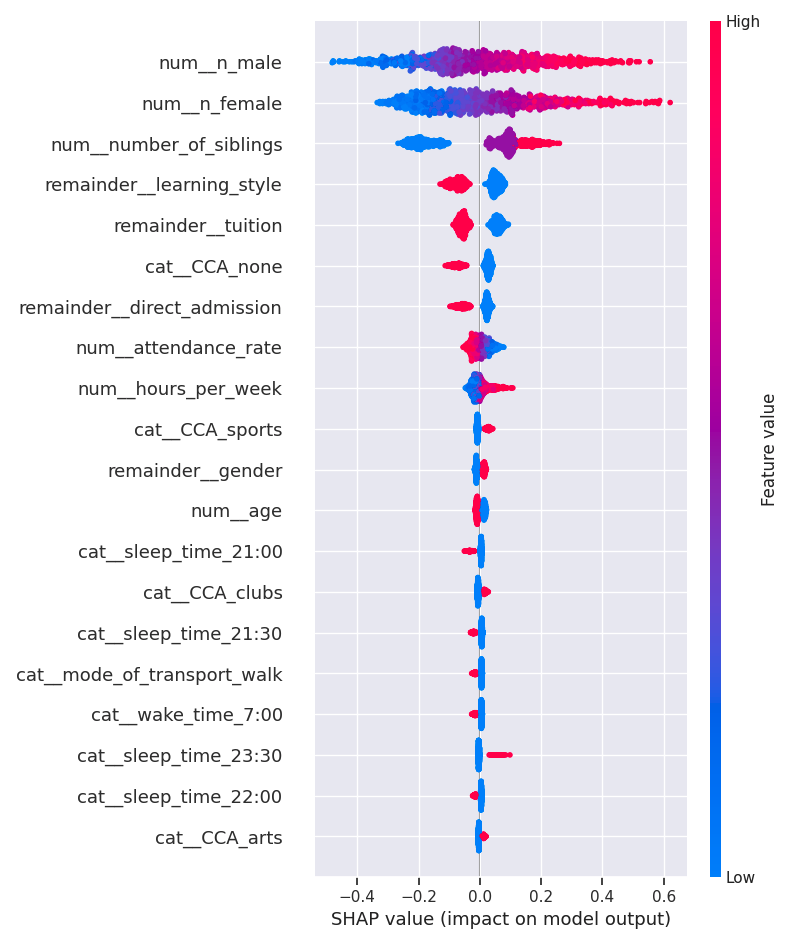

In [ ]:
#for classifer output of 1
shap.decision_plot(explainer_rf.expected_value[1], shap_values[1], X_test.columns)

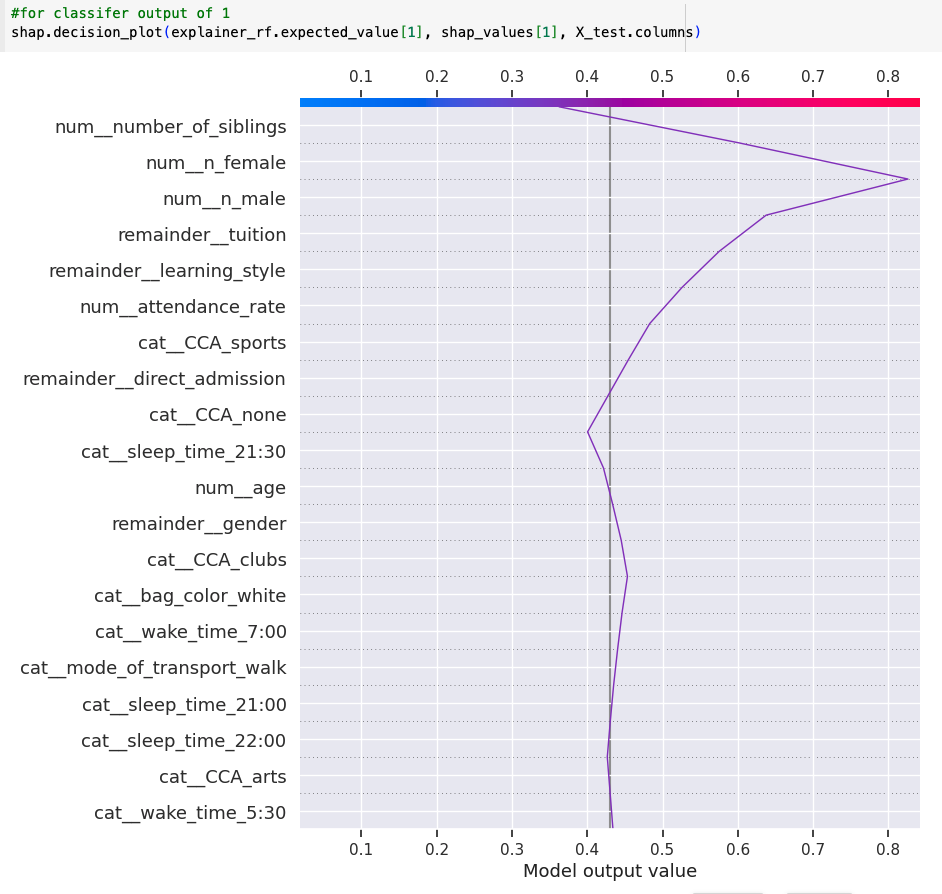

In [ ]:
#for classifer output of 0
shap.decision_plot(explainer_rf.expected_value[0], shap_values[0], X_test.columns)

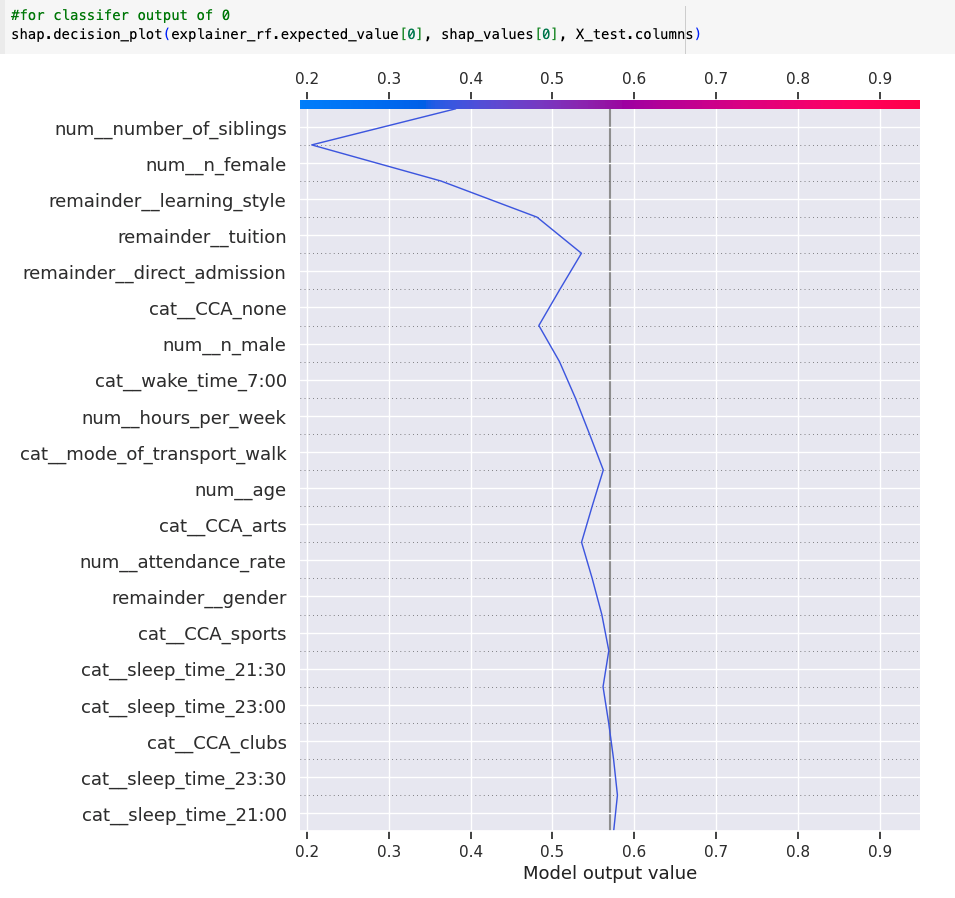



---

End of project



###Marking
This assignment constitutes 50% of your total marks for this module. Marks will be allocated based
on the completeness, thoroughness and accuracy of the report. The weightage for each of the
components are detailed below:


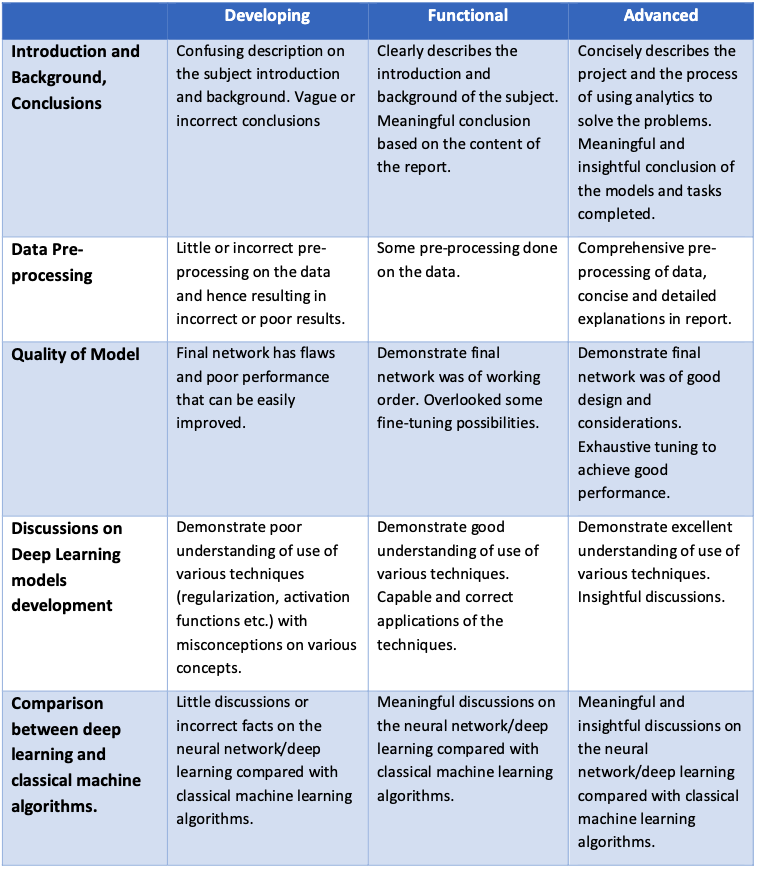

# references
https://medium.com/analytics-vidhya/build-your-first-neural-network-model-on-a-structured-dataset-using-keras-d9e7de5c6724


REFERENCES

data source: https://techassessment.bob.core.windows.net/aiap-preparatory-bootcamp/score.db

project challenge: https://github.com/aisingapore/AIAP-Technical-Assessment-Past-Years-Series/tree/main/StudentScorePrediction

https://www.tensorflow.org/tutorials/keras/keras_tuner

https://en.wikipedia.org/wiki/Academic_grading_in_Singapore

https://keras.io/guides/keras_tuner/visualize_tuning/

https://www.datacamp.com/tutorial/introduction-to-shap-values-machine-learning-interpretability

https://www.yourdatateacher.com/2021/05/17/

how-to-explain-neural-networks-using-shap/

McNemar’s test https://towardsdatascience.com/mcnemars-test-to-evaluate-machine-learning-classifiers-with-python-9f26191e1a6b#:~:text=McNemar's%20test,have%20a%20lot%20of%20data.

# appendix


---



The choice between **Hyperband and RandomSearch** in Keras Tuner depends on the characteristics of your search space, the available computational resources, and the problem at hand. Here are some considerations for each:

### Hyperband:

- **Pros:**
  - **Efficient Exploration:** Hyperband is designed for efficient exploration of the hyperparameter space. It intelligently allocates resources to promising configurations.
  - **Early Stopping:** The bracketing mechanism allows early stopping of less promising configurations, saving computational resources.

- **Cons:**
  - **Computational Cost:** Hyperband can be computationally expensive, especially if you have limited resources. It involves running multiple trials in parallel.

- **Recommendation:** Use Hyperband when you have sufficient computational resources, and you want to efficiently explore the hyperparameter space with the possibility of early stopping less promising configurations.

### RandomSearch:

- **Pros:**
  - **Simple and Parallelizable:** RandomSearch is straightforward and easy to parallelize. It randomly samples configurations from the search space, which can be beneficial in certain scenarios.

- **Cons:**
  - **Exploration Efficiency:** RandomSearch may not be as efficient as Hyperband in terms of exploring the hyperparameter space, especially if the search space is large and contains regions with promising configurations.

- **Recommendation:** Use RandomSearch when you have limited computational resources, or when you want a simpler approach that is easy to parallelize.

### Considerations:

1. **Search Space Size:** If your search space is relatively small, RandomSearch might be sufficient. If it's large and complex, Hyperband's efficiency in exploring the space might be beneficial.

2. **Available Resources:** Hyperband often benefits from parallel processing, so if you have access to multiple compute resources, it can be more effective.

3. **Early Stopping:** If early stopping is crucial for your application, Hyperband provides a built-in mechanism for that.

4. **Exploration vs. Exploitation:** Hyperband tends to balance exploration and exploitation better, which can be advantageous in scenarios where you want to find a good configuration quickly.

In practice, it's often beneficial to experiment with both Hyperband and RandomSearch to see which one performs better for your specific use case. You might also consider other tuners available in Keras Tuner, such as Bayesian optimization-based tuners, depending on your requirements.